<a href="https://colab.research.google.com/github/DheerenGaud/Attendance-BY-NN/blob/main/CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd 'drive/My Drive/Project11'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
/content/drive/My Drive/Project11


In [ ]:
import tensorflow as tf

from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.layers import ReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
# Reading Data
df = pd.read_csv('Dataset.csv', index_col=0)


In [ ]:
X = df.iloc[:, :100*100].values.reshape(-1, 100, 100, 1)
y = df.iloc[:, -1].values

In [ ]:
X.shape, y.shape

((10029, 100, 100, 1), (10029,))

In [ ]:
# One Hot Encoding the labels
y = to_categorical(y, num_classes= 1+ df.loc[:, 'class'].unique().shape[0])

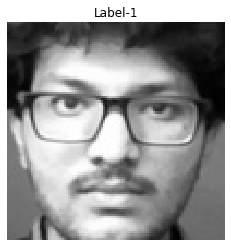

In [ ]:
# random Image
q = np.random.randint(100*100)
plt.imshow(X[q][:,:,0], cmap='gray')
plt.title(f'Label-{np.argmax(y[q])}')
plt.axis('off')
plt.show()

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X, y, random_state=42, test_size=0.15)

print(f'Train Size - {X_train.shape}\nTest Size - {X_test.shape}')

Train Size - (8524, 100, 100, 1)
Test Size - (1505, 100, 100, 1)


In [ ]:
# Artificially increase training set
train_datagen = ImageDataGenerator(rescale=1./255.,
                                   rotation_range=10,
                                   width_shift_range=0.25,
                                   height_shift_range=0.25,
                                   shear_range=0.1,
                                   zoom_range=0.25,
                                   horizontal_flip=False)

valid_datagen = ImageDataGenerator(rescale=1./255.)


In [ ]:
from datetime import datetime


In [ ]:

num_classes = 4
model_name = 'Face_trained_model_'+datetime.now().strftime("%H_%M_%S_")

In [ ]:
model = Sequential(name = model_name)

model.add(Conv2D(64, kernel_size=3, activation='relu', input_shape=(100, 100, 1)))
model.add(BatchNormalization()) #----------------
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(BatchNormalization()) #----------------
model.add(Conv2D(64, kernel_size=5, padding='same', activation='relu'))
model.add(BatchNormalization()) #----------------
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2)) #----------------

model.add(Conv2D(128, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(128, kernel_size=5, padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(256, kernel_size=3, activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(256))
model.add(BatchNormalization())
model.add(Dense(128))
model.add(BatchNormalization())
model.add(Dense(5, activation='softmax'))

model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "Face_trained_model_08_38_30_"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 64)        640       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 64)        256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 64)        36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 96, 96, 64)        256       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 96, 96, 64)        102464    
_________________________________________________________________
batch_normalization_2 (Batch (None, 96, 96, 64)        256       
_______________________

In [ ]:

learning_rate = 0.001
optimizer = RMSprop(lr=learning_rate)

model.compile(loss='categorical_crossentropy',optimizer=optimizer,metrics=['accuracy'])

In [ ]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=200,
                                            verbose=1,
                                            factor=0.2)

ch = ModelCheckpoint('models/'+model_name+'.h5', monitor='val_acc', verbose=0, save_best_only=True, mode='max')

es = EarlyStopping(monitor='val_loss', mode='min', verbose=0, patience=200)

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs/"+datetime.now().strftime("%Y%m%d-%H%M%S"))


In [ ]:
# ls

In [ ]:
epochs = 50
batch_size = 256
history = model.fit_generator(train_datagen.flow(X_train, y_train, batch_size=batch_size),
                              steps_per_epoch= X_train.shape[0]//batch_size,
                              epochs=epochs,
                              validation_data=valid_datagen.flow(X_test, y_test),
                              validation_steps=50,
                              verbose = 1,
                              callbacks=[learning_rate_reduction, es, ch, tensorboard_callback])

Epoch 1/50
33/33 [==============================] - 33s 996ms/step - loss: 0.4573 - acc: 0.8471 - val_loss: 5.8574 - val_acc: 0.2492
Epoch 2/50
33/33 [==============================] - 33s 988ms/step - loss: 0.3535 - acc: 0.8893 - val_loss: 12.5854 - val_acc: 0.2588
Epoch 3/50
33/33 [==============================] - 33s 990ms/step - loss: 0.1697 - acc: 0.9451 - val_loss: 3.7698 - val_acc: 0.1364
Epoch 4/50
33/33 [==============================] - 34s 1s/step - loss: 0.1495 - acc: 0.9543 - val_loss: 13.5269 - val_acc: 0.2594
Epoch 5/50
33/33 [==============================] - 34s 1s/step - loss: 0.1088 - acc: 0.9671 - val_loss: 13.9172 - val_acc: 0.2607
Epoch 6/50
33/33 [==============================] - 33s 998ms/step - loss: 0.0916 - acc: 0.9698 - val_loss: 10.7673 - val_acc: 0.3193
Epoch 7/50
33/33 [==============================] - 34s 1s/step - loss: 0.0995 - acc: 0.9688 - val_loss: 4.3927 - val_acc: 0.3709
Epoch 8/50
33/33 [==============================] - 33s 1s/step - loss: 0.

In [ ]:
loss, acc = model.evaluate(valid_datagen.flow(X_test, y_test))

print(f'Loss: {loss}\nAccuracy: {acc*100}')

48/48 [==============================] - 2s 39ms/step - loss: 0.0111 - acc: 0.9987
Loss: 0.011081109298629599
Accuracy: 99.86711144447327


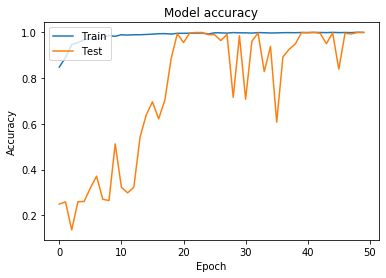

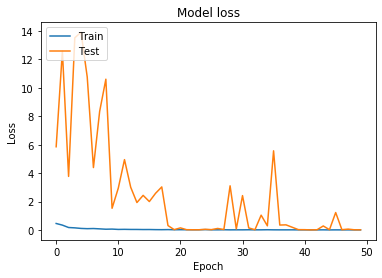

In [ ]:
# Plot training & test accuracy values
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & test loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir logs/

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(np.argmax(y_test, axis=1), np.argmax(model.predict(X_test),axis=1)))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00       388
           2       1.00      0.99      1.00       398
           3       1.00      1.00      1.00       372
           4       1.00      1.00      1.00       347

    accuracy                           1.00      1505
   macro avg       1.00      1.00      1.00      1505
weighted avg       1.00      1.00      1.00      1505



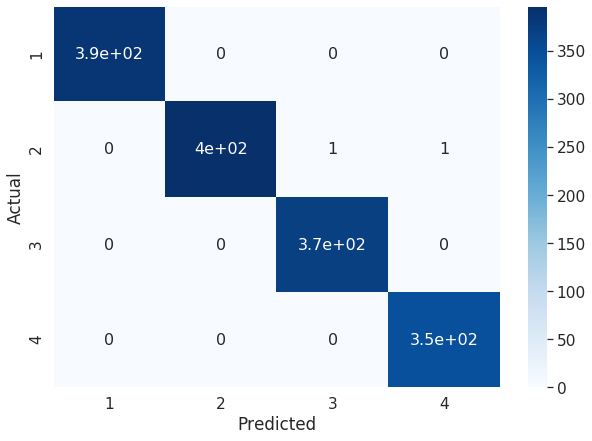

In [ ]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score
import seaborn as sn
y_true = np.argmax(y_test, axis=1)
y_pred = np.argmax(model.predict(X_test), axis=1)
data = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(data, columns=np.unique(y_true), index = np.unique(y_true))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sn.set(font_scale=1.4)#for label size
sn.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})# font size

In [ ]:
print(f1_score(y_true, y_pred, average="macro")*100)
print(precision_score(y_true, y_pred, average="macro")*100)
print(recall_score(y_true, y_pred, average="macro")*100)

99.86749943780711
99.8611367908539
99.87437185929649


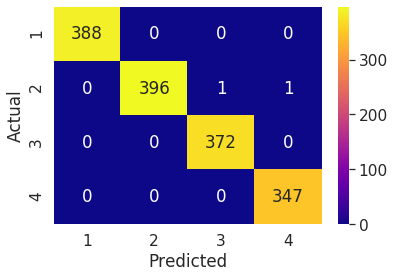

In [ ]:
sn.heatmap(df_cm, annot=True, fmt="d", cmap="plasma");


In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, cohen_kappa_score
def AA_andEachClassAccuracy(confusion_matrix):
    from operator import truediv
    counter = confusion_matrix.shape[0]
    list_diag = np.diag(confusion_matrix)
    list_raw_sum = np.sum(confusion_matrix, axis=1)
    each_acc = np.nan_to_num(truediv(list_diag, list_raw_sum))
    average_acc = np.mean(each_acc)
    return each_acc, average_acc

def reports (nn_model, X_test,y_test):
    #start = time.time()
    Y_pred = nn_model.predict(X_test)
    y_pred = np.argmax(Y_pred, axis=1)
    #end = time.time()
    #print(end - start

    classification = classification_report(np.argmax(y_test, axis=1), y_pred, target_names=['1', '2','3','4'])
    target_names=['1', '2','3','4']
    oa = accuracy_score(np.argmax(y_test, axis=1), y_pred)
    confusion = confusion_matrix(np.argmax(y_test, axis=1), y_pred)
    each_acc, aa = AA_andEachClassAccuracy(confusion)
    kappa = cohen_kappa_score(np.argmax(y_test, axis=1), y_pred)
    score = nn_model.evaluate(X_test, y_test, batch_size=32)
    Test_Loss =  score[0]
    Test_accuracy = score[1]*100

    return classification, confusion, Test_Loss, Test_accuracy, oa*100, '\n'.join([' : '.join(map(str, i)) for i in zip(target_names, each_acc*100)]), aa*100, kappa*100



classification, confusion, Test_loss, Test_accuracy, oa, each_acc, aa, kappa = reports(model, X_test, y_test)
classification = str(classification)
confusion = str(confusion)
file_name = "Face_Classification_report.txt"

with open(file_name, 'w') as x_file:
    x_file.write('\nTest loss: {}%'.format(Test_loss))
    x_file.write('\n')
    x_file.write('Test accuracy: {}%'.format(Test_accuracy))
    x_file.write('\n')
    x_file.write('\n')
    x_file.write('Kappa accuracy: {}%'.format(kappa))
    x_file.write('\n')
    x_file.write('Overall accuracy: {}%'.format(oa))
    x_file.write('\n')
    x_file.write('Average accuracy: {}%'.format(aa))
    x_file.write('\n\n')
    x_file.write('Classwise Accuracy: \n{}'.format(each_acc))
    x_file.write('\n\n')
    x_file.write('Classification Report:\n{}'.format(classification))
    x_file.write('\n\n')
    x_file.write('Confusion Matrix:\n{}'.format(confusion))

1505/1505 [==============================] - 1s 659us/sample - loss: 0.0193 - acc: 0.9987


In [ ]:
ls

 batch_normalization_1.png           'HydCon Work.gdoc'
 batch_normalization_2.png            image_at_epoch_0001.png
 batch_normalization_3.png            image_at_epoch_0002.png
 batch_normalization_4.png            image_at_epoch_0003.png
 batch_normalization_5.png            image_at_epoch_0004.png
 batch_normalization_6.png            image_at_epoch_0005.png
 batch_normalization.png              image_at_epoch_0006.png
 CNN.ipynb                            KNNC.ipynb
 conv2d_1.png                         logs/
 conv2d_2.png                         max_pooling2d_1.png
 conv2d_3.png                         max_pooling2d_2.png
 conv2d_4.png                         max_pooling2d.png
 conv2d_5.png                         model_history.csv
 conv2d_6.png                         model.json
 conv2d.png                           model.png
 Dataset.csv                          models/
 Dataset_In_3D.csv                    model_with_shapes.png
'Dataset_In_3D_using_KPCA(rbf).csv'   network.gv

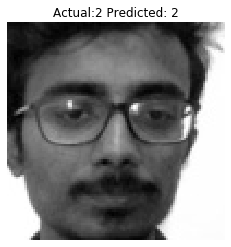

In [ ]:
# Verify
rand_n = np.random.randint(X_test.shape[0])
plt.imshow(X_test[rand_n][:, :, 0], cmap='gray')
plt.title(f'Actual:{np.argmax(y_test[rand_n])} Predicted: {np.argmax(model.predict(X_test[rand_n].reshape(-1, 100, 100, 1)))}');
plt.axis('off')
plt.show()

In [ ]:
def plot_predictions(r=5 ,c =5):
  w=10
  h=10
  fig=plt.figure(figsize=(12, 12))
  columns = c
  rows = r
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      rand_n = np.random.randint(X_test.shape[0])
      plt.imshow(X_test[rand_n][:, :, 0], cmap='gray')
      plt.title(f'Actual:{np.argmax(y_test[rand_n])} Predicted: {np.argmax(model.predict(X_test[rand_n].reshape(-1, 100, 100, 1)))}');
      plt.axis('off')
  plt.show()

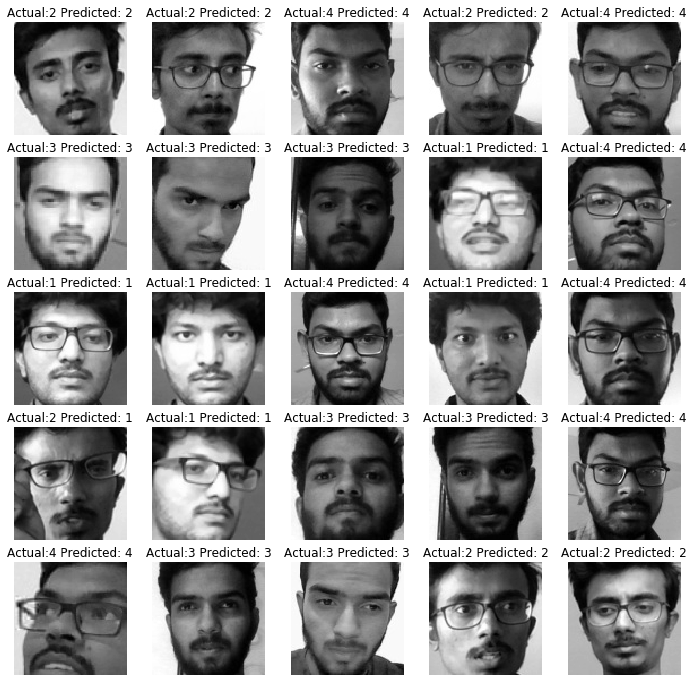

In [ ]:
plot_predictions()

In [ ]:
# serialize weights to HDF5
model.save(model_name+".h5")
print("Model Saved to disk")

Model Saved to disk


In [ ]:
# Loding model from disk
from tensorflow.keras.models import load_model
model1 = load_model('models/Face_trained_model_04_12_16.h5')

In [ ]:
loss, acc = model1.evaluate(valid_datagen.flow(X_test, y_test))

48/48 [==============================] - 2s 38ms/step - loss: 0.0057 - acc: 0.9987


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(np.argmax(y_test, axis=1), np.argmax(model1.predict(X_test), axis=1)))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       388
           2       0.21      0.69      0.32       398
           3       0.26      0.14      0.18       372
           4       0.00      0.00      0.00       347

    accuracy                           0.22      1505
   macro avg       0.12      0.21      0.13      1505
weighted avg       0.12      0.22      0.13      1505



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
ls models/

Face_trained_model_04_12_16.h5


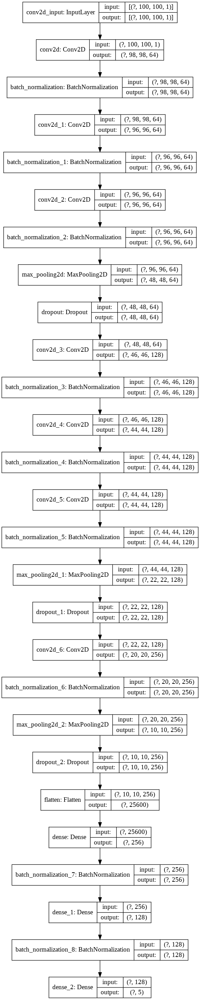

In [ ]:
tf.keras.utils.plot_model(
    model1,
    to_file='model_with_shapes.png',
    show_shapes=True,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96
)

## Intermediate layer visualization of the CNN

In [ ]:
model1.summary()

Model: "Face_trained_model_04_12_16_.h5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 64)        640       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 64)        256       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 64)        36928     
_________________________________________________________________
batch_normalization_1 (Batch (None, 96, 96, 64)        256       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 96, 96, 64)        102464    
_________________________________________________________________
batch_normalization_2 (Batch (None, 96, 96, 64)        256       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None,

In [ ]:
from tensorflow.keras.models import Model
layer_outputs = [layer.output for layer in model1.layers[:20]]
activation_model = Model(inputs=model1.input, outputs=layer_outputs)

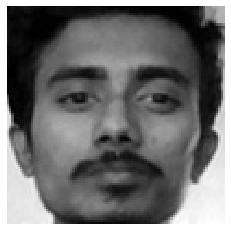

In [ ]:
plt.imshow(X_test[28][:,:,0], cmap='gray');
plt.axis('off');

In [ ]:
activations = activation_model.predict(X_test[28].reshape(-1, 100, 100, 1))

In [ ]:
count =0
for layer in activations:
  count+=1
  print('Layer:%2d    Shape: %s ' %(count, str(layer.shape)))

Layer: 1    Shape: (1, 98, 98, 64) 
Layer: 2    Shape: (1, 98, 98, 64) 
Layer: 3    Shape: (1, 96, 96, 64) 
Layer: 4    Shape: (1, 96, 96, 64) 
Layer: 5    Shape: (1, 96, 96, 64) 
Layer: 6    Shape: (1, 96, 96, 64) 
Layer: 7    Shape: (1, 48, 48, 64) 
Layer: 8    Shape: (1, 48, 48, 64) 
Layer: 9    Shape: (1, 46, 46, 128) 
Layer:10    Shape: (1, 46, 46, 128) 
Layer:11    Shape: (1, 44, 44, 128) 
Layer:12    Shape: (1, 44, 44, 128) 
Layer:13    Shape: (1, 44, 44, 128) 
Layer:14    Shape: (1, 44, 44, 128) 
Layer:15    Shape: (1, 22, 22, 128) 
Layer:16    Shape: (1, 22, 22, 128) 
Layer:17    Shape: (1, 20, 20, 256) 
Layer:18    Shape: (1, 20, 20, 256) 
Layer:19    Shape: (1, 10, 10, 256) 
Layer:20    Shape: (1, 10, 10, 256) 


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


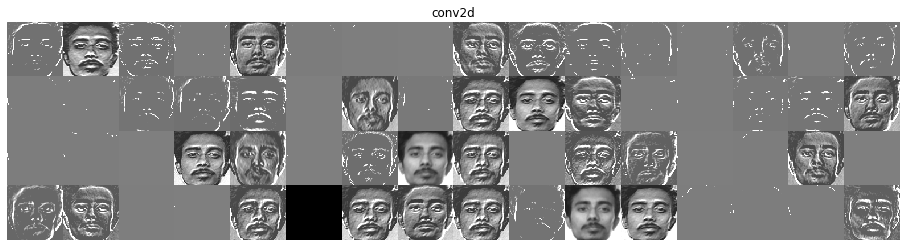

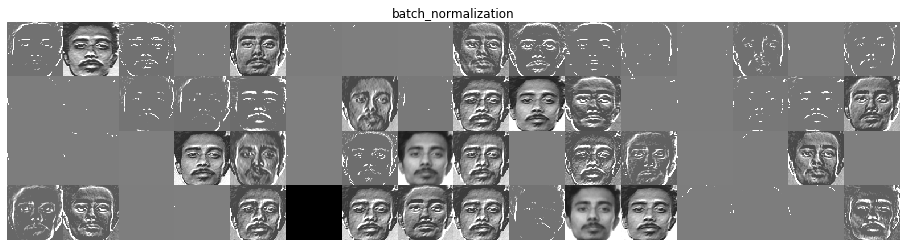

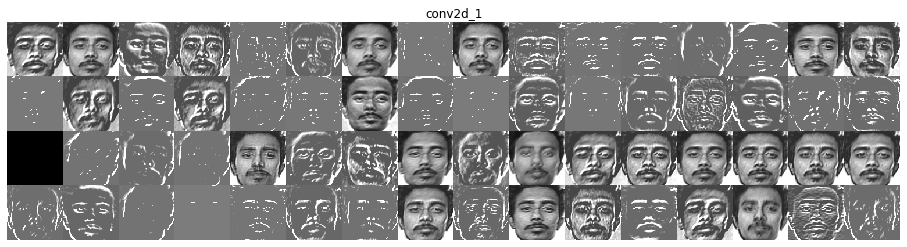

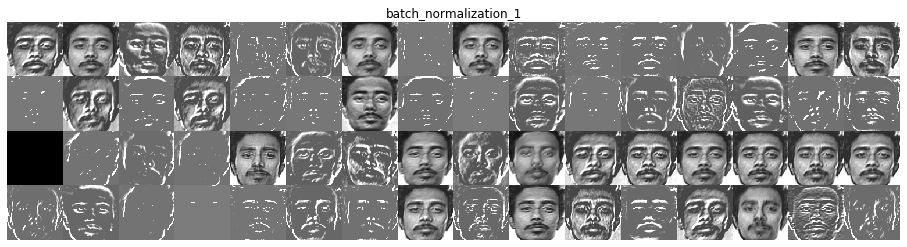

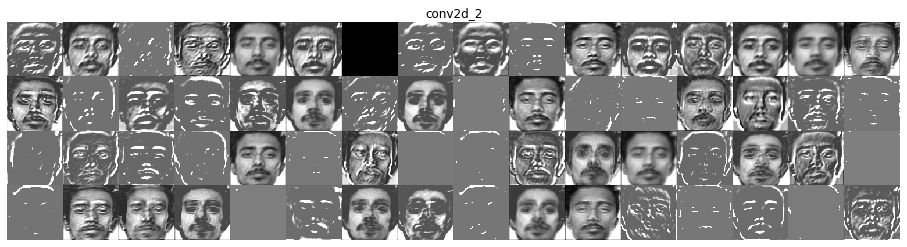

...

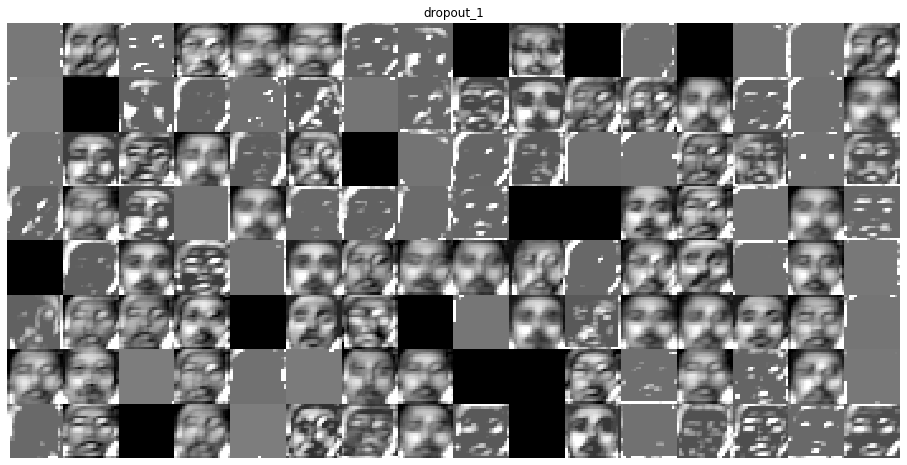

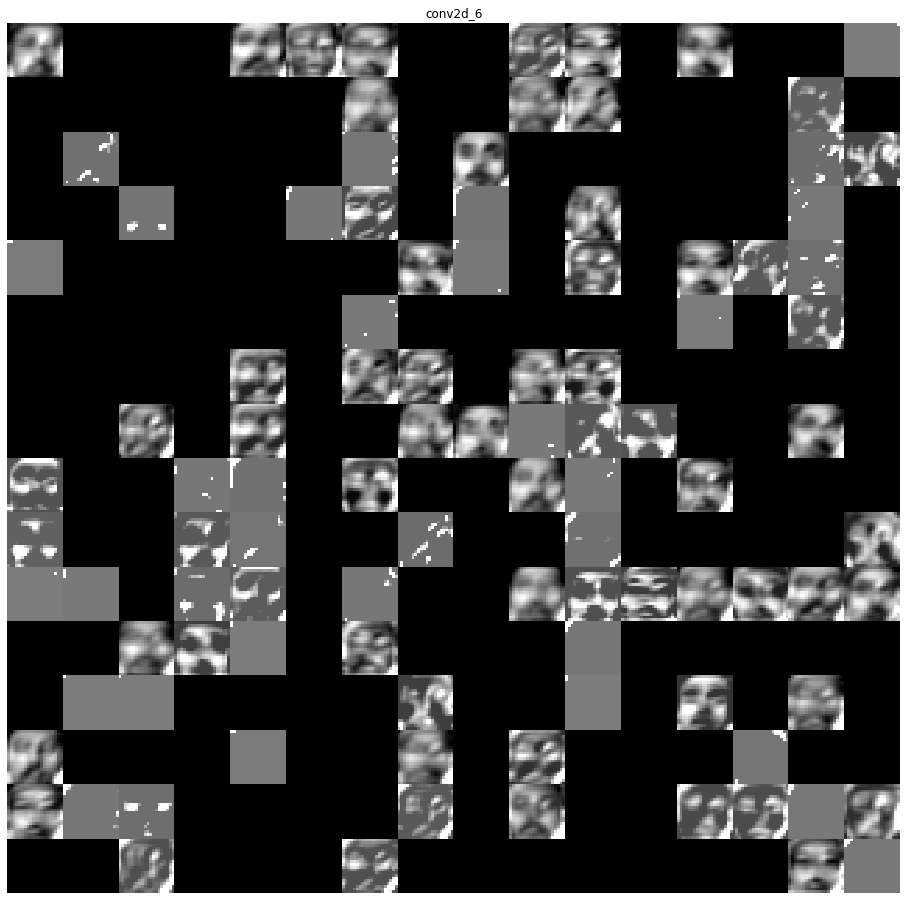

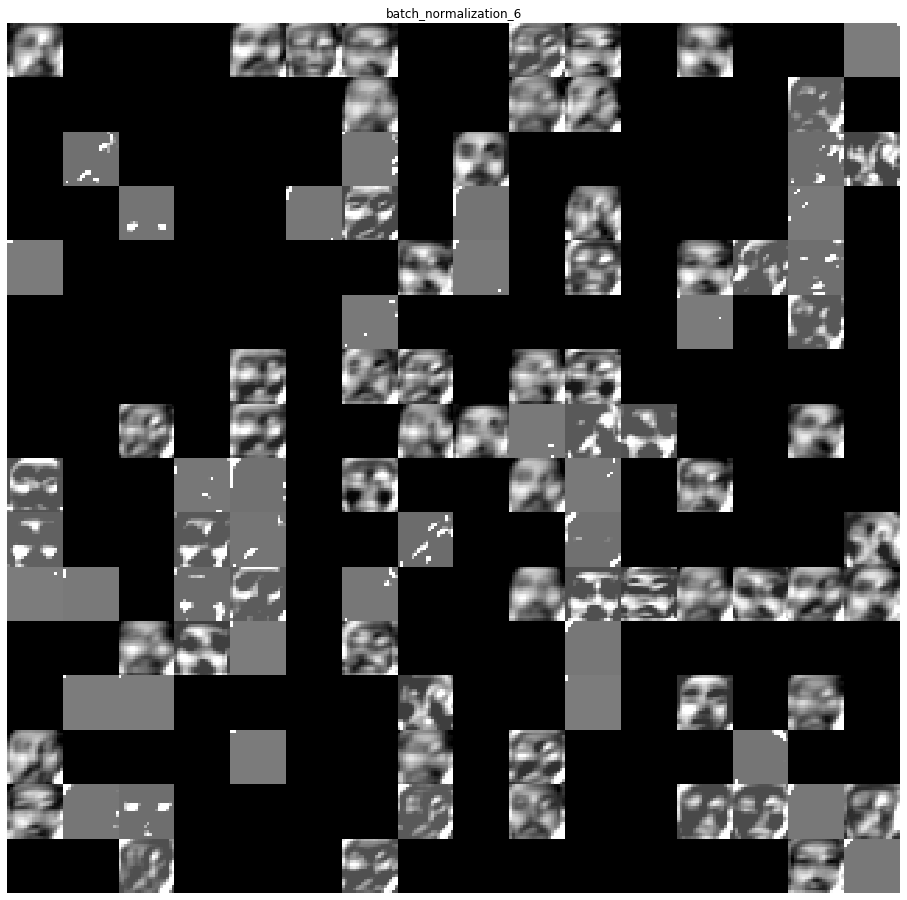

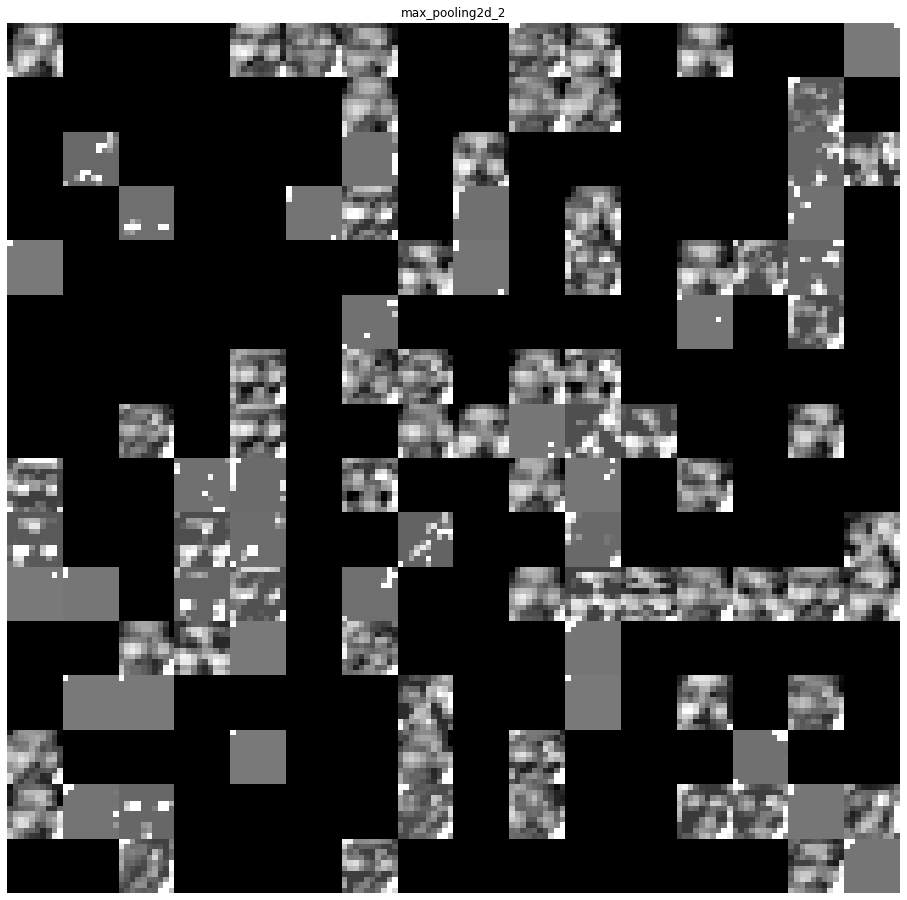

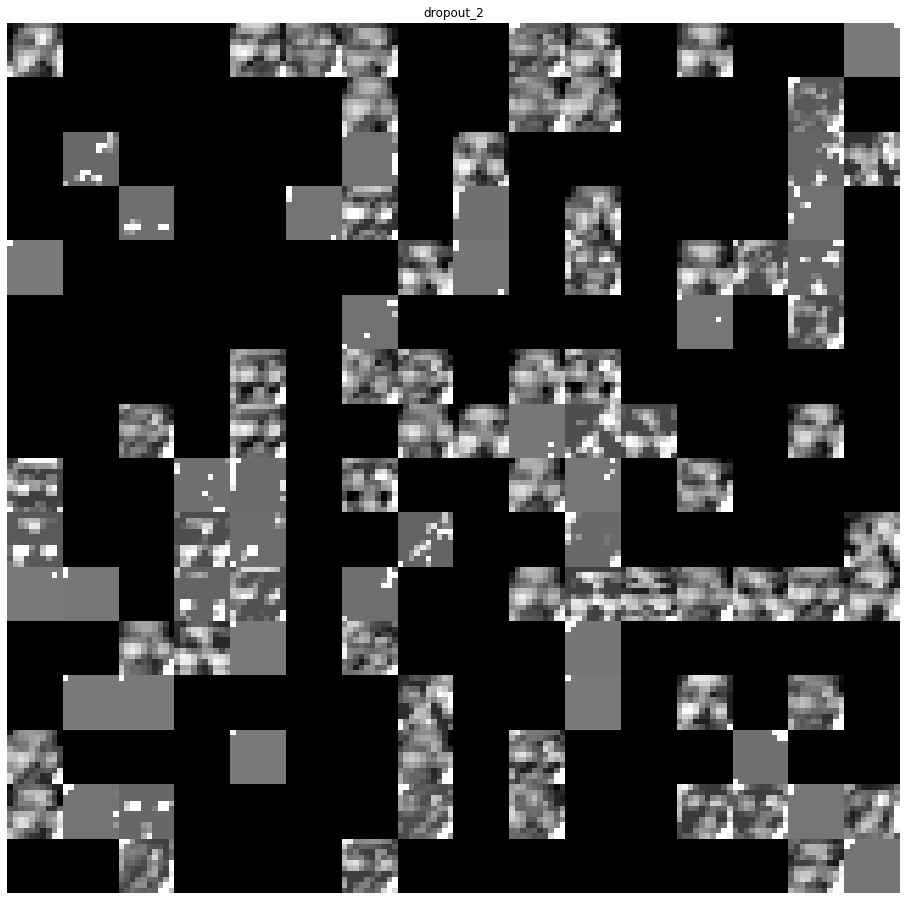

In [ ]:
layer_names = []
for layer in model1.layers[:20]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(display_grid, aspect='auto', cmap='gray')
    plt.savefig(layer_name+'.png')

In [ ]:
#   # serialize model to JSON
# model_json = model1.to_json()
# with open("model.json", "w") as json_file:
#     json_file.write(model_json)

Data Agumentation

In [ ]:
def plot_aug(data,r=5 , c =5):
  w=10
  h=10
  fig=plt.figure(figsize=(12, 12))
  columns = c
  rows = r
  for i in range(1, columns*rows +1):
      fig.add_subplot(rows, columns, i)
      rand_n = np.random.randint(data.shape[0])
      plt.imshow(data[rand_n], cmap='gray')
      # plt.title(f'Actual:{np.argmax(y_test[rand_n])} Predicted: {np.argmax(model.predict(X_test[rand_n].reshape(-1, 100, 100, 1)))}');
      plt.axis('off')
  plt.show()

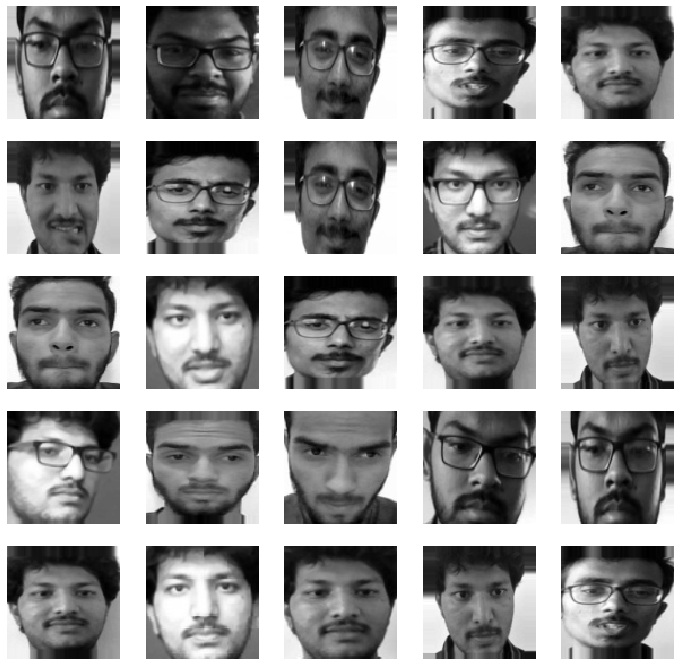

In [ ]:
# plt.imshow(au_x[0], cmap='gray')
# plt.axis('off')
data = ImageDataGenerator(rescale=1./255.,
                                  #  rotation_range=10,
                                  #  width_shift_range=0.25,
                                  #  height_shift_range=0.25,
                                  #  shear_range=0.1,
                                   zoom_range=0.25,
                                  #  horizontal_flip=False
                          ).flow(X_train, y_train)
au_x, au_y = data.next()[0].reshape(32,100,100), data.next()[1]
au_x.shape, au_y.shape
plot_aug(au_x)